#### This project utilizes the Webscraping tutorial found at https://github.com/snazrul1/PyRevolution/blob/master/Puzzles/PokeScraper.ipynb. I used it to help me scrape the first dataset and then I followed along to figure out how to scrape the 2nd and 3rd websites.

#### The analysis portion of this notebook follows along with this kaggle notebook https://www.kaggle.com/yassinealouini/pokemons-machine-learning-101. The results are different (most likely due to the features that I used) and I attempted to use some different models.

## This project is an assignment for my Data Science class at university.  I am hoping to learn from this process as well as exihibit some of the knowledge that I have gained from the class.

# 1.  Pose a prediction question that can be answered with data and a machine learning model
####  Can we predict a new pokemon's primary type (type_1) using machine learning?

In [135]:
import numpy as np
import requests, six
import lxml.html as lh
from itertools import cycle, islice
from matplotlib import colors
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# 2.  Collect data to answer your question via webscraping, APIs and/or combining several readily availabledataset (i.e.  kaggle, uci ML repo, etc.)

In [70]:
# Set up the url for scraping
url1='http://pokemondb.net/pokedex/all'
url2='https://bulbapedia.bulbagarden.net/wiki/List_of_fully_evolved_Pokémon_by_base_stats'
url3='https://pokemon.fandom.com/wiki/List_of_Pokémon_by_evolution'

In [71]:
# Handle url1
#Create a handle, page, to handle the contents of the website
page1 = requests.get(url1)
#Store the contents of the website under doc
doc1 = lh.fromstring(page1.content)
#Parse data that are stored between <tr>..</tr> of the site's HTML code
tr_elements1 = doc1.xpath('//tr')
#Check the length of the first 12 rows
[len(T) for T in tr_elements1[:12]]

[10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10]

In [72]:
# Handle url2
#Create a handle, page, to handle the contents of the website
page2 = requests.get(url2)
#Store the contents of the website under doc
doc2 = lh.fromstring(page2.content)
#Parse data that are stored between <tr>..</tr> of the site's HTML code
tr_elements2 = doc2.xpath('//tr')
#Check the length of the first 12 rows
[len(T) for T in tr_elements2[:12]]

[11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]

In [73]:
# Handle url3
#Create a handle, page, to handle the contents of the website
page3 = requests.get(url3)
#Store the contents of the website under doc
doc3 = lh.fromstring(page3.content)
#Parse data that are stored between <tr>..</tr> of the site's HTML code
tr_elements3 = doc3.xpath('//tr')
#Check the length of the first 12 rows
[len(T) for T in tr_elements3[:12]]

[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]

In [74]:
#First row should be the header
tr_elements1 = doc1.xpath('//tr')

#Create empty list
col1=[]
i=0

#For each row, store each first element (header) and an empty list
for t in tr_elements1[0]:
    i+=1
    name=t.text_content()
    print('%d:"%s"'%(i,name))
    col1.append((name,[]))

1:"#"
2:"Name"
3:"Type"
4:"Total"
5:"HP"
6:"Attack"
7:"Defense"
8:"Sp. Atk"
9:"Sp. Def"
10:"Speed"


In [75]:
#First row should be the header
tr_elements2 = doc2.xpath('//tr')
#Create empty list
col2=[]
i=0
#For each row, store each first element (header) and an empty list
for t in tr_elements2[0]:
    i+=1
    name=t.text_content()
    print('%d:"%s"'%(i,name))
    col2.append((name,[]))

1:" #
"
2:"
"
3:" Pokémon
"
4:" HP
"
5:" Attack
"
6:" Defense
"
7:" Sp. Attack
"
8:" Sp. Defense
"
9:" Speed
"
10:" Total
"
11:" Average
"


In [76]:
#First row should be the header
tr_elements3 = doc3.xpath('//tr')
#Create empty list
col3=[]
i=0
#For each row, store each first element (header) and an empty list
for t in tr_elements3[0]:
    i+=1
    name=t.text_content()
    print('%d:"%s"'%(i,name))
    col3.append((name,[]))

1:"
"
2:"Unevolved Pokémon/Basic Pokémon
"
3:"First-Evolved Pokémon/Stage 1 Pokémon
"
4:"Second-Evolved/Stage 2
"


In [77]:
#Since out first row is the header, data is stored on the second row onwards
for j in range(1,len(tr_elements1)):
    #T is our j'th row
    T=tr_elements1[j]
    
    #If row is not of size 10, the //tr data is not from our table 
    if len(T)!=10:
        break
    
    #i is the index of our column
    i=0
    
    #Iterate through each element of the row
    for t in T.iterchildren():
        data=t.text_content() 
        #Check if row is empty
        if i>0:
        #Convert any numerical value to integers
            try:
                data=int(data)
            except:
                pass
        #Append the data to the empty list of the i'th column
        col1[i][1].append(data)
        #Increment i for the next column
        i+=1

In [78]:
#Since out first row is the header, data is stored on the second row onwards
for j in range(1,len(tr_elements2)):
    #T is our j'th row
    T=tr_elements2[j]
    
    #If row is not of size 11, the //tr data is not from our table 
    if len(T)!=11:
        break
    
    #i is the index of our column
    i=0
    
    #Iterate through each element of the row
    for t in T.iterchildren():
        data=t.text_content() 
        #Check if row is empty
        if i>0:
        #Convert any numerical value to integers
            try:
                data=int(data)
            except:
                pass
        #Append the data to the empty list of the i'th column
        col2[i][1].append(data)
        #Increment i for the next column
        i+=1

In [79]:
#Since out first row is the header, data is stored on the second row onwards
for j in range(1,len(tr_elements3)):
    #T is our j'th row
    T=tr_elements3[j]
    
    #If row is not of size 4, the //tr data is not from our table 
    if len(T)!=4:
        break
    
    #i is the index of our column
    i=0
    
    #Iterate through each element of the row
    for t in T.iterchildren():
        data=t.text_content() 
        #Check if row is empty
        if i>0:
        #Convert any numerical value to integers
            try:
                data=int(data)
            except:
                pass
        #Append the data to the empty list of the i'th column
        col3[i][1].append(data)
        #Increment i for the next column
        i+=1

In [80]:
#Sanity check for url1
[len(C) for (title,C) in col1]


[1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045, 1045]

In [81]:
#Sanity check for url2
[len(C) for (title,C) in col2]

[606, 606, 606, 606, 606, 606, 606, 606, 606, 606, 606]

In [82]:
#Sanity check for url3
[len(C) for (title,C) in col3]

[463, 463, 463, 463]

In [83]:
# URL 1 convert to Pandas dataframe
Dict={title:column for (title,column) in col1}
df1=pd.DataFrame(Dict)
df1.head()

,#,Name,Type,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
0,001,Bulbasaur,Grass Poison,318,45,49,49,65,65,45
1,002,Ivysaur,Grass Poison,405,60,62,63,80,80,60
2,003,Venusaur,Grass Poison,525,80,82,83,100,100,80
3,003,Venusaur Mega Venusaur,Grass Poison,625,80,100,123,122,120,80
4,004,Charmander,Fire,309,39,52,43,60,50,65


In [84]:
# URL 2 convert to Pandas dataframe
Dict={title:column for (title,column) in col2}
df2=pd.DataFrame(Dict)
df2.head()

,#\n,\n,Pokémon\n,HP\n,Attack\n,Defense\n,Sp. Attack\n,Sp. Defense\n,Speed\n,Total\n,Average\n
0,003\n,\n,Venusaur\n,80,82,83,100,100,80,525,87.5\n
1,003\n,\n,Venusaur (Mega Venusaur)\n,80,100,123,122,120,80,625,104.17\n
2,006\n,\n,Charizard\n,78,84,78,109,85,100,534,89
3,006\n,\n,Charizard (Mega Charizard X)\n,78,130,111,130,85,100,634,105.67\n
4,006\n,\n,Charizard (Mega Charizard Y)\n,78,104,78,159,115,100,634,105.67\n


In [85]:
# URL 3 convert to Pandas dataframe
Dict={title:column for (title,column) in col3}
df3=pd.DataFrame(Dict)
df3.columns = ['index','Basic','Stage1','Stage2']
df3.head()

,index,Basic,Stage1,Stage2
0,1\n,Bulbasaur\n,Ivysaur\n,Venusaur\n
1,2\n,Charmander\n,Charmeleon\n,Charizard\n
2,3\n,Squirtle\n,Wartortle\n,Blastoise\n
3,4\n,Caterpie\n,Metapod\n,Butterfree\n
4,5\n,Weedle\n,Kakuna\n,Beedrill\n


#### Now that the data has been successfully scraped and stored in Pandas dataframes let's do some basic EDA and then we can move on to some cleaning.

In [86]:
import pandas_profiling as pd_pro 
profile_pokemon = pd_pro.ProfileReport(df1, title='Pokemon data')
profile_pokemon

#### The warning of correlation between df_index and pokemon # is fine since we won't be using either for predicting Type 1.
#### Total is highly corelated with the other stats (which makes sense because it is calculated from those stats).

In [87]:
df1.dtypes

#          object
Name       object
Type       object
Total       int64
HP          int64
Attack      int64
Defense     int64
Sp. Atk     int64
Sp. Def     int64
Speed       int64
dtype: object

#### There also appears to be a few outliers, so I may decide to remove some of those.

# 3.  Clean / wrangle your data

In [88]:
#Name and Type sections are disorganized in df1. df2 only care about first column. df3 only care about stage_1.

# Function to help fix Name column
def str_bracket(word):
    '''Add brackets around second term'''
    list = [x for x in word]
    for char_ind in range(1, len(list)):
        if list[char_ind].isupper():
            list[char_ind] = ' ' + list[char_ind]
    fin_list = ''.join(list).split(' ')
    length = len(fin_list)
    if length>1:
        fin_list.insert(1,'(')
        fin_list.append(')')
    return ' '.join(fin_list)

In [89]:
# Call function on Name column in df1
df1['Name']=df1['Name'].apply(str_bracket)
df1.head()

,#,Name,Type,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
0,001,Bulbasaur,Grass Poison,318,45,49,49,65,65,45
1,002,Ivysaur,Grass Poison,405,60,62,63,80,80,60
2,003,Venusaur,Grass Poison,525,80,82,83,100,100,80
3,003,Venusaur ( Mega Venusaur ),Grass Poison,625,80,100,123,122,120,80
4,004,Charmander,Fire,309,39,52,43,60,50,65


In [90]:
# Fix Type column in df1
df1[['Type_1','Type_2']] = df1.Type.str.split(expand=True)
df1 = df1.drop(['Type'], axis = 1)
df1.head()

,#,Name,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Type_1,Type_2
0,001,Bulbasaur,318,45,49,49,65,65,45,Grass,Poison
1,002,Ivysaur,405,60,62,63,80,80,60,Grass,Poison
2,003,Venusaur,525,80,82,83,100,100,80,Grass,Poison
3,003,Venusaur ( Mega Venusaur ),625,80,100,123,122,120,80,Grass,Poison
4,004,Charmander,309,39,52,43,60,50,65,Fire,None


In [91]:
# Type_2 has many missing values so we fill them.
df1['Type_2'] = df1['Type_2'].fillna('None')

In [92]:
# Check
df1['Type_2'].isna()

0       False
1       False
2       False
3       False
4       False
        ...  
1040    False
1041    False
1042    False
1043    False
1044    False
Name: Type_2, Length: 1045, dtype: bool

In [93]:
# convert Pokemon number column to numeric in df1
df1['#'] = df1['#'].astype(int)

In [94]:
# Clean the [' #\n'] column for df2
df2[' #\n'] = df2[' #\n'].str.extract('(\d+)', expand=False)

In [95]:
#convert to numeric
df2[' #\n'] = df2[' #\n'].astype(int) 
#send to list
fully_evolved_list = df2[' #\n'].tolist()
# get rid of duplicate numbers
fully_evolved_list = list(set(fully_evolved_list)) 

In [96]:
# Fix stage_1 in df3.
# First remove the \n in the strings.
df3['Stage1'] = df3['Stage1'].map(lambda x: x.lstrip('\n').rstrip('\n'))
stage1_df = pd.DataFrame(df3['Stage1'])
# Get rid of empty rows
stage1_df = stage1_df.loc[stage1_df['Stage1'] != '']
# Save stage1 to lists to be used in feature creation later.
stage1_list = stage1_df['Stage1'].tolist()

In [97]:
df3.head()

,index,Basic,Stage1,Stage2
0,1\n,Bulbasaur\n,Ivysaur,Venusaur\n
1,2\n,Charmander\n,Charmeleon,Charizard\n
2,3\n,Squirtle\n,Wartortle,Blastoise\n
3,4\n,Caterpie\n,Metapod,Butterfree\n
4,5\n,Weedle\n,Kakuna,Beedrill\n


### The data is now mostly cleaned and ready to be used for feature engineering. We may do a bit more cleaning in the next step as we continue to work with the data. Let's create 4 new columns with information that may be useful for predicting a new Pokemon's primary type.

# 4.  Create features

In [98]:
# 1. Legendary
df1['Legendary'] = 'No'
# create list of legendary pokemon
legend_list = [144,145,146,150,151,243,244,245,249,250,251,377,378,379,380,381,382,383,384,385,386,480,481,482,
               483,484,485,486,487,488,489,490,491,492,493,494,638,639,640,641,642,643,644,645,646,647,648,649,
              716,717,718,719,720,721,773,785,786,787,788,791,792,800,801,802,807,809,888,889,890,892,893,894,
              895,896,897,898]
df1.loc[df1['#'].isin(legend_list),['Legendary']] = 'Legendary'
# create list of Ultra Beast pokemon
ub_list = [793,794,795,796,797,798,799,804,805,806]
df1.loc[df1['#'].isin(ub_list),['Legendary']] = 'UB'
# create list of psuedo legendaries
psuedo_list = [149,248,373,376,445,635,706,784,887,887]
df1.loc[df1['#'].isin(psuedo_list),['Legendary']] = 'Psuedo'

In [99]:
# Check
df1.loc[df1['#'] == 890]

,#,Name,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Type_1,Type_2,Legendary
1032,890,Eternatus,690,140,85,95,145,95,130,Poison,Dragon,Legendary
1033,890,Eternatus ( Eternamax ),1125,255,115,250,125,250,130,Poison,Dragon,Legendary


In [100]:
# 2. Evolution
df1['Evolution'] = 'Basic'
# list of starter pokemon
starter_list = [1,4,7,152,155,158,252,255,258,387,390,393,495,498,501,650,653,656,722,725,728,810,813,816]
df1.loc[df1['#'].isin(starter_list),['Evolution']] = 'Starter'
# list of baby pokemon
baby_list = [172,173,174,175,236,238,239,240,298,360,406,433,438,439,440,446,447,458,848]
df1.loc[df1['#'].isin(baby_list),['Evolution']] = 'Baby'
# Stage1 evolutions
df1.loc[df1['Name'].isin(stage1_list),['Evolution']] = 'Middle'
# Mega evolutions
df1.loc[df1['Name'].str.contains('Mega'),['Evolution']] = 'Mega'
# Full stage evolutions
df1.loc[(df1['#'].isin(fully_evolved_list)) & (df1['Evolution'] != 'Mega'),['Evolution']] = 'Full'

In [101]:
#Fix some odd ones that I found

#special pikachu should be middle
df1.loc[df1['Name'] == "Pikachu (  Partner  Pikachu )", ['Evolution']] = 'Middle' 
#These are all pokemon with no evolutions that don't make sense to call them Fully evolved
df1.loc[(df1['Evolution'] == 'Full') & (df1['Total'] <= 380) & (df1['Name']!="Shedinja"), ['Evolution']] = 'Basic' 
#Meganium ended up Mega
df1.loc[df1['#'] == 154, ['Evolution']] = 'Full' 
#cascoon/silcoon got skipped in stage1 list.
df1.loc[(df1['#'] == 266) | (df1['#'] == 268), 'Evolution'] = 'Middle' 
# 718 Zygarde should have his evolution line fixed since his different forms function more like evolutions.
df1.loc[df1['Name'] == 'Zygarde ( 10%  Forme )',['Evolution']] = 'Basic'
df1.loc[df1['Name'] == 'Zygarde ( 50%  Forme )',['Evolution']] = 'Middle'

#### Many Pokemon have special forms that change the stats or types of a pokemon. Perhaps it will be helpful to include that information as a feature.

In [102]:
# 3. Forms
df1['Form'] = 'None'

# these numbers but Name != Necrozma,Kyogre,Groudon,Kyurem,Greninja,Hoopa (  Hoopa  Confined ),Wishiwashi (  Solo  Form ),Zacian (  Hero of  Many  Battles ),Zamazenta (  Hero of  Many  Battles ),Eternatus,Calyrex
name_list = ["Pikachu","Necrozma","Kyogre","Groudon","Kyurem","Greninja","Hoopa (  Hoopa  Confined )","Wishiwashi (  Solo  Form )","Zacian (  Hero of  Many  Battles )","Zamazenta (  Hero of  Many  Battles )","Eternatus","Calyrex"]
power_form_list = [25,382,383,646,658,720,746,800,888,889,890,898]
df1.loc[(df1['#'].isin(power_form_list)) & (~df1['Name'].isin(name_list)),['Form']] = 'Powered'

swap_form_list = [351,386,413,479,487,492,555,641,642,645,648,681,710,711,745,774,875]
df1.loc[df1['#'].isin(swap_form_list),['Form']] = 'Swap'

#### Pokemon that have good stats in certain areas will be prefered for specific roles in the game. While this feature may have high correlation with the stats themselves, it could be useful for prediction.

In [103]:
# 4. Combat Roles
df1['Role'] = 'None'

# Defensive Walls
df1.loc[(df1['HP'] >= 75) & (df1['Defense'] >= 90) & ((df1['Defense'] + df1['HP']) >= 180)
        & (df1['Legendary'] != 'Legendary'),['Role']] = 'Physical Wall'

df1.loc[(df1['HP'] >= 75) & (df1['Sp. Def'] >= 90) & ((df1['Sp. Def'] + df1['HP']) >= 180)
        & (df1['Legendary'] != 'Legendary'),['Role']] = 'Special Wall'

df1.loc[((df1['HP'] >= 65) & (df1['Sp. Def'] >= 100) & (df1['Defense'] >= 100)
        & ((df1['Sp. Def'] + df1['HP'] + df1['Defense']) >= 280)
        &(df1['Legendary'] != 'Legendary')) 
        | (((df1['Sp. Def'] + df1['HP'] + df1['Defense']) >= 300)),['Role']] = 'Mixed Wall'

df1.loc[((df1['Speed'] >= 85) & (df1['Attack'] >= 81) & ((df1['Attack'] + df1['Speed']) >= 180)
        & (df1['HP'] >= 50) & (df1['Legendary'] != 'Legendary')) | (((df1['Attack'] + df1['Speed']) >= 200) 
        & (df1['HP'] >= 50)),['Role']] = 'Physical Sweeper'

# Offense focused team sweepers
df1.loc[((df1['Speed'] >= 85) & (df1['Sp. Atk'] >= 81) & ((df1['Sp. Atk'] + df1['Speed']) >= 180)
        & (df1['HP'] >= 50) & (df1['Attack']<=(df1['Sp. Atk']+30)) & (df1['Legendary'] != 'Legendary')) 
        | (((df1['Sp. Atk'] + df1['Speed']) >= 200) & (df1['HP'] >= 50) 
        & (df1['Attack']<=(df1['Sp. Atk']+30))),['Role']] = 'Special Sweeper'

df1.loc[((df1['Speed'] >= 80) & (df1['Sp. Atk'] >= 95) & (df1['Attack'] >= 95)
        & ((df1['Sp. Atk'] + df1['Speed'] + df1['Attack']) >= 280)
        & (df1['HP'] >= 50) & (df1['Legendary'] != 'Legendary')) 
        | (((df1['Sp. Atk'] + df1['Speed'] + df1['Attack']) >= 300) 
        & (df1['Attack']<=(df1['Sp. Atk']+30)) & (df1['Sp. Atk']<=(df1['Attack']+30))),['Role']] = 'Mixed Sweeper'

In [104]:
# The tail gives us a good sample of these 4 new columns.
df1.tail(10)

,#,Name,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Type_1,Type_2,Legendary,Evolution,Form,Role
1035,892,Urshifu ( Single Strike Style ),550,100,130,100,63,60,97,Fighting,Dark,Legendary,Full,None,Physical Sweeper
1036,892,Urshifu ( Rapid Strike Style ),550,100,130,100,63,60,97,Fighting,Water,Legendary,Full,None,Physical Sweeper
1037,893,Zarude,600,105,120,105,70,95,105,Dark,Grass,Legendary,Full,None,Physical Sweeper
1038,894,Regieleki,580,80,100,50,100,50,200,Electric,None,Legendary,Full,None,Mixed Sweeper
1039,895,Regidrago,580,200,100,50,100,50,80,Dragon,None,Legendary,Full,None,Mixed Wall
1040,896,Glastrier,580,100,145,130,65,110,30,Ice,None,Legendary,Full,None,Mixed Wall
1041,897,Spectrier,580,100,65,60,145,80,130,Ghost,None,Legendary,Full,None,Special Sweeper
1042,898,Calyrex,500,100,80,80,80,80,80,Psychic,Grass,Legendary,Full,None,None
1043,898,Calyrex ( Ice Rider ),680,100,165,150,85,130,50,Psychic,Ice,Legendary,Full,Powered,Physical Sweeper
1044,898,Calyrex ( Shadow Rider ),680,100,85,80,165,100,150,Psychic,Ghost,Legendary,Full,Powered,Special Sweeper


#### Looking good. Lastly, I will remove a few pokemon that I think should not be included.

In [105]:
# Shedinja is a very unique pokemon that doesn't make sense in any category (stats wise). 
# Might be best to remove Shedinja, but let's revert it to basic.
df1.loc[df1['Name']=="Shedinja", 'Evolution'] = 'Basic'
# index 757 Keldeo #647 should be dropped since his other form is exactly the same.
df1 = df1.drop([757])
# It seems Eternatus is an extreme outlier.
#Since Eternatus is meant to be an uncatchable boss pokemon it may make sense to take it out of the dataset.
df1 = df1.drop([1033])

In [106]:
df1 = df1.reset_index()

#### This is a multi-class classification problem with Flying and Fairy being very underrepresented.

#### Let's make some Dummies! Transform categorical columns into boolean ones Type 1, Type 2, Legendary, Evolution, and Form columns.

#### I will use pandas get_dummies function. Also, since not every Pokemon has a Type 2, I have filled the missing values with the "None" type before dummifying. I  used a LabelEncoder for Type 1 (since it contains strings).

#### Lastly, drop Type_1, Name, # from the features and move on to more EDA and building some prediction models.

#### The code for this part comes in large part from this notebook https://www.kaggle.com/yassinealouini/pokemons-machine-learning-101

In [107]:
target_s = df1['Type_1']
target_col = 'Type_1'
drop_col_list = ["#", "Name"]

In [108]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
encoded_target_s = pd.Series(le.fit_transform(target_s), name="encoded_type_1")
dummified_target_s = pd.get_dummies(target_s)
dummified_features_df = (df1.drop(drop_col_list + [target_col], axis=1)
                                   #.assign(**{"Legendary": lambda df: df1["Legendary"].astype(int), 
                                   #           "Type 2": lambda df: df1["Type_2"].fillna("missing")})
                                   .pipe(pd.get_dummies))
features_and_targets_df = pd.concat([encoded_target_s, dummified_features_df], axis=1)




In [109]:
encoded_target_s.sample(10)

367    16
118    13
587     1
757    17
127    14
777     0
65     10
705    16
524    15
929    16
Name: encoded_type_1, dtype: int32

In [110]:
le.inverse_transform(encoded_target_s.sample(5))

array(['Dragon', 'Fire', 'Psychic', 'Psychic', 'Fairy'], dtype=object)

In [111]:
dummified_target_s.sample(5)

,Bug,Dark,Dragon,Electric,Fairy,Fighting,Fire,Flying,Ghost,Grass,Ground,Ice,Normal,Poison,Psychic,Rock,Steel,Water
951,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
420,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
775,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
547,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
601,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


# 5.  Explore the data through EDA

#### While this step is listed after the feature engineering and data cleaning steps (3,4) I did some basic EDA prior to those steps. This EDA will look at my dataframe that I will use for my models.

In [112]:
# Some EDA in one line of code

import pandas_profiling as pd_pro 
profile_pokemon = pd_pro.ProfileReport(features_and_targets_df, title='Pokemon data')
profile_pokemon

#### 1. The warning of many 0's in the encoded_type_1 column is fine, since 0 just repesents one of the 18 types.
#### 2. I still need to drop the index column before moving on to analysis.
#### 3. There appears to be some intercorrelation between features, but nothing too extreme apart from Legendary and non-Legendary.
#### To finish this section I'll make a new dataframe with the Type_1 added back in to look at the correlations.

In [113]:
import seaborn as sns 
import matplotlib.pyplot as plt

### Since we are interested in predicting Type 1 I think it is good to take a look at all of the pokemon sorted by Type 1. 

Text(0.5, 1.0, 'Total Pokemon by Type 1')

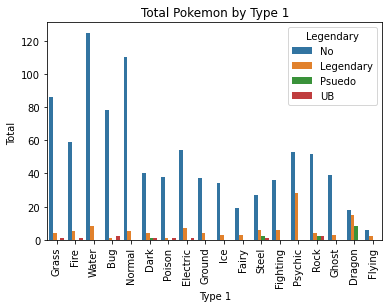

In [114]:
sns.set_color_codes("pastel")
ax = sns.countplot(x="Type_1", hue="Legendary", data=df1)
plt.xticks(rotation= 90)
plt.xlabel('Type 1')
plt.ylabel('Total ')
plt.title("Total Pokemon by Type 1")

### Interestingly Water is the most common for Type 1. I guess there are a lot of fish pokemon. Normal is a close second and Flying is the least common. 
### Dragon and Psychic are also interesting. While their non legendary counts are not particularily high, they have the highest number of legendary pokemon. Perhaps legendary will be a strong prediction factor.
### There are lot's of bird pokemon, but I suppose their main type must be something other than Flying and their secondary type would be flying.

Text(0.5, 1.0, 'Total Pokemon by Type 2')

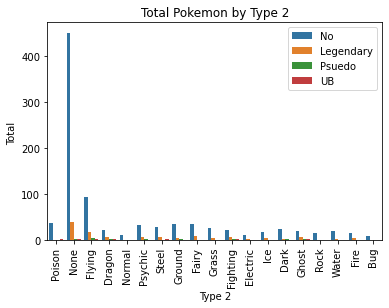

In [115]:
sns.set_color_codes("pastel")
ax = sns.countplot(x="Type_2", hue="Legendary", data=df1)
plt.legend(loc='upper right')
plt.xticks(rotation= 90)
plt.xlabel('Type 2')
plt.ylabel('Total ')
plt.title("Total Pokemon by Type 2")

### As expected flying type is the most common Type 2 when a second type is present.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 <a list of 18 Text major ticklabel objects>)

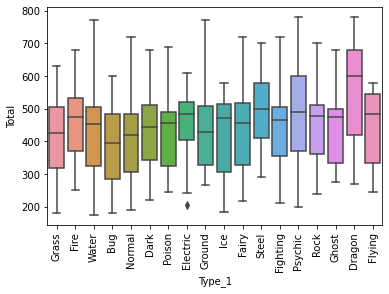

In [116]:
# Which pokemon Type have the highest stats?
sns.boxplot(x="Type_1", y="Total", data=df1)
plt.xticks(rotation= 90)

In [117]:
features_and_targets_df = features_and_targets_df.drop(['df_index'], axis=1)

In [120]:
# Use dummified_target instead of encoded target to look at correlation plot.
corr_df = pd.concat([dummified_features_df, dummified_target_s], axis=1).corr()
corr_df = corr_df.drop(['index'], axis = 1)
corr_df = corr_df.drop(['index'], axis = 0)

In [121]:
corr_df

,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Type_2_Bug,Type_2_Dark,Type_2_Dragon,...,Ghost,Grass,Ground,Ice,Normal,Poison,Psychic,Rock,Steel,Water
Total,1.000000,0.637526,0.740004,0.618165,0.736149,0.710410,0.559642,-0.047797,0.063596,0.127213,...,0.009465,-0.052215,-0.012425,-0.012229,-0.098652,-0.033671,0.122867,0.020904,0.065875,-0.025145
HP,0.637526,1.000000,0.448078,0.273153,0.369346,0.366414,0.179995,-0.044894,0.044609,0.118971,...,-0.039790,-0.037194,0.007633,0.017664,0.097035,0.004633,0.039941,-0.026272,-0.002488,0.012711
Attack,0.740004,0.448078,1.000000,0.459368,0.368733,0.266703,0.373527,-0.023661,0.146994,0.068860,...,-0.040864,-0.053695,0.085380,-0.011571,-0.056275,-0.034148,-0.037669,0.086452,0.077960,-0.064014
Defense,0.618165,0.273153,0.459368,1.000000,0.218025,0.528113,-0.006887,-0.027388,-0.014110,0.078187,...,0.036436,-0.026667,0.072207,-0.011235,-0.152194,-0.013488,-0.020692,0.188570,0.261940,-0.018460
Sp. Atk,0.736149,0.369346,0.368733,0.218025,1.000000,0.512656,0.442810,-0.036909,0.038495,0.156388,...,0.066226,0.020124,-0.113566,-0.025553,-0.169262,-0.030844,0.232639,-0.087398,-0.017703,0.019703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Poison,-0.033671,0.004633,-0.034148,-0.013488,-0.030844,-0.027570,-0.029063,0.035348,0.124643,0.053245,...,-0.040906,-0.061742,-0.040396,-0.038298,-0.070300,1.000000,-0.057947,-0.049338,-0.037759,-0.076346
Psychic,0.122867,0.039941,-0.037669,-0.020692,0.232639,0.166097,0.112838,-0.027072,-0.024744,-0.029691,...,-0.059438,-0.089713,-0.058697,-0.055649,-0.102148,-0.057947,1.000000,-0.071689,-0.054865,-0.110933
Rock,0.020904,-0.026272,0.086452,0.188570,-0.087398,0.006266,-0.090532,0.065990,0.011585,0.005254,...,-0.050607,-0.076384,-0.049975,-0.047381,-0.086971,-0.049338,-0.071689,1.000000,-0.046713,-0.094450
Steel,0.065875,-0.002488,0.077960,0.261940,-0.017703,0.029628,-0.094552,-0.017640,-0.030823,0.028763,...,-0.038730,-0.058457,-0.038247,-0.036261,-0.066560,-0.037759,-0.054865,-0.046713,1.000000,-0.072284


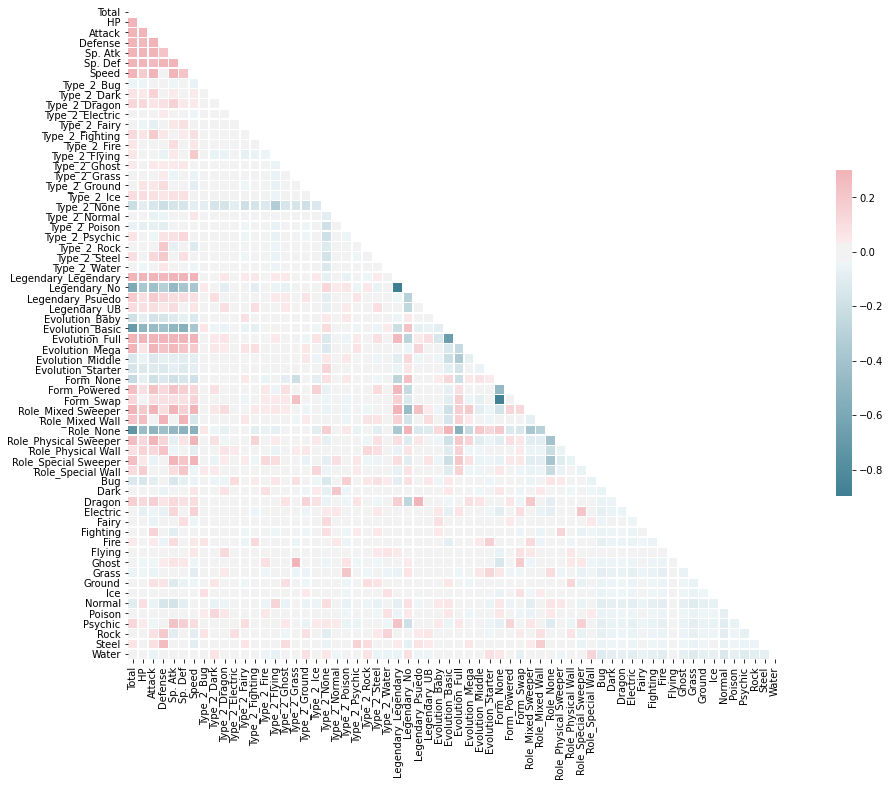

In [122]:
mask = np.zeros_like(corr_df, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_df, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

#### Some correlations of interest are:
#### 1. Steel and rock are positively correlated with Defense.
#### 2. Dragon is positively correlated with all of the stats.
#### 3. Psychic is positively correlated with Sp. Atk and Sp. Defense.
#### 4. Fighting is positively correlated with Attack.
#### 5. Electric is positively correlated with Speed and Sp. Atk.
#### 6. Ghost type has a positive correlation with the Grass secondary type.
#### 7. Dragon type is positively correlated with the Legendary type.

#### Lastly there does appear to be lot's of weak positive and negative correlations between our target and our features so hopefully our model works out.

## 6.  Analyze the data with multiple machine learning approaches

In [123]:
# Start with splitting the data into training and testing sets.
from sklearn.model_selection import train_test_split, cross_val_score 

train_df, test_df = train_test_split(features_and_targets_df, 
                                     stratify=encoded_target_s, 
                                     test_size= .2, random_state=582)

In [124]:
train_df.head()

,encoded_type_1,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Type_2_Bug,Type_2_Dark,...,Form_None,Form_Powered,Form_Swap,Role_Mixed Sweeper,Role_Mixed Wall,Role_None,Role_Physical Sweeper,Role_Physical Wall,Role_Special Sweeper,Role_Special Wall
844,14,680,80,160,60,170,130,80,0,1,...,0,1,0,1,0,0,0,0,0,0
714,2,320,46,87,60,30,40,57,0,0,...,1,0,0,0,0,1,0,0,0,0
1031,13,690,140,85,95,145,95,130,0,0,...,1,0,0,0,0,0,0,0,1,0
22,12,479,83,80,75,70,70,101,0,0,...,1,0,0,0,0,1,0,0,0,0
137,10,425,60,80,110,50,80,45,0,0,...,1,0,0,0,0,1,0,0,0,0


####  Since this an unbalanced multi-class classification problem, the F1 score with weighted average makes the most sense to use. As explained in the sklearn documentation our F1 score is computed for each class then we take the weighted average using the true classes count.

#### With the data split and a metric is chosen I will now build some ML models.

## Logistic Regression as a baseline

In [125]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import f1_score, confusion_matrix
# import model
from sklearn.linear_model import LogisticRegression
# Train our model
train_features_df = train_df.drop("encoded_type_1", axis=1)
train_target_s = train_df["encoded_type_1"]

In [126]:
def improvement_in_percent(model_score, baseline_score):
    return (100 * (model_score - baseline_score)  / baseline_score).round(3)

In [127]:
lr = LogisticRegression(random_state=582)
lr_scores = cross_val_score(lr, X=train_features_df, y=train_target_s, cv=6, scoring="f1_weighted")
print("Logistic regression mean and std scores are: ({}, {})".format(lr_scores.mean(), lr_scores.std()))
lr.fit(train_features_df, train_target_s)

Logistic regression mean and std scores are: (0.15461764104854628, 0.020959396071531838)


LogisticRegression(random_state=582)

## Random Forest

In [128]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(random_state=582)
rf_clf_scores = cross_val_score(rf_clf, X=train_features_df, y=train_target_s, cv=6, scoring="f1_weighted")
print("Simple random forests classification mean and std scores are: ({}, {})".format(rf_clf_scores.mean(), rf_clf_scores.std()))
print("This is a {} % improvement".format(improvement_in_percent(rf_clf_scores.mean(), lr_scores.mean())))
rf_clf.fit(train_features_df, train_target_s)

Simple random forests classification mean and std scores are: (0.2700572676779436, 0.029553620723013995)
This is a 74.661 % improvement


RandomForestClassifier(random_state=582)

## KNN

In [129]:
from sklearn.neighbors import KNeighborsClassifier
knn_clf = KNeighborsClassifier(n_neighbors=1)
knn_clf_scores = cross_val_score(knn_clf, X=train_features_df, y=train_target_s, cv=6, scoring="f1_weighted")


print("K Nearest Neighbors classification mean and std scores are: ({}, {})".format(knn_clf_scores.mean(), knn_clf_scores.std()))
print("This is a {} % improvement".format(improvement_in_percent(knn_clf_scores.mean(), lr_scores.mean())))
knn_clf.fit(train_features_df, train_target_s)

K Nearest Neighbors classification mean and std scores are: (0.172968705775571, 0.02246487009762602)
This is a 11.869 % improvement


KNeighborsClassifier(n_neighbors=1)

## Nueral Network

In [130]:
from sklearn.neural_network import MLPClassifier
nn_clf = MLPClassifier(random_state=582)
nn_clf_scores = cross_val_score(nn_clf, X=train_features_df, y=train_target_s, cv=5, scoring="f1_weighted")
print("Simple classification neural network mean and std scores are: ({}, {})".format(nn_clf_scores.mean(), nn_clf_scores.std()))
print("This is a {} % improvement".format(improvement_in_percent(nn_clf_scores.mean(), lr_scores.mean())))

nn_clf.fit(train_features_df, train_target_s)

Simple classification neural network mean and std scores are: (0.15354058751512217, 0.022856720599505442)
This is a -0.697 % improvement


MLPClassifier(random_state=582)

# 7.  Evaluate each model

In [131]:
test_features_df = test_df.drop("encoded_type_1", axis=1)
encoded_test_targets_s = test_df["encoded_type_1"]

In [132]:
def test_evaluation(clf):
    """
    Evaluate a classifier on the test dataset. Returns a confusion matrix and F1 score. 
    """
    encoded_test_predictions_s = clf.predict(test_features_df)
    test_predictions_s = pd.Series(le.inverse_transform(encoded_test_predictions_s), 
                                   name="predicted_type_1")
    test_targets_s = pd.Series(le.inverse_transform(encoded_test_targets_s), 
                               name="true_type_1")
    test_cm = confusion_matrix(test_targets_s, test_predictions_s)
    test_f1_score = f1_score(test_targets_s, test_predictions_s, average='weighted').round(3)
    return test_cm, test_f1_score

In [133]:
test_cm_knn, test_f1_score_knn = test_evaluation(knn_clf)
test_cm_rf, test_f1_score_rf = test_evaluation(rf_clf)
test_cm_lr, test_f1_score_lr = test_evaluation(lr)

In [134]:
print("KNN test F1 weighted score is {}".format(test_f1_score_knn))
print("RF test F1 weighted score is {}".format(test_f1_score_rf))
print("Logistic regression test F1 weighted score is {}".format(test_f1_score_lr))

KNN test F1 weighted score is 0.177
RF test F1 weighted score is 0.239
Logistic regression test F1 weighted score is 0.171


#### With low F1 scores like this it is clear that the models were unable to predict the data with the features that I used. I believe I have overfit the models with weak features. That being said, one of the goals of this project was to create new features that I thought would be helpful. I may have been better off simply using 1 or none of the added features.

# 8.  Answer the original question



#### Can we predict a new pokemon's primary type (type_1) using machine learning?
#### In this case the ML models did not do a good job according to our evaluation metrics. Were I to try this project again I would likely use less feature engineering and try to simply fit the model with the original data, then add features 1 at a time.
#### Since this project has two main goals 1. It is meant as a learning experience from my Data Science course at University and 2. I am meant to utilize or practice all of the techniques that have been taught in the class.

#  9.  Understand and explain potential sources of bias in how your data/model answers your question of interest

#### According to my understanding the primary source of bias from the data would be in missing data that I then would have to impute or remove.
#### The missing data in this dataset was primarily in the Type_2 column. However, it wasn't exactly missing so much as the pokemon simply did not have a second type. In this case I simply created an additional type called None, however another option could be that I imputed the pokemon's type1 to it's type2 if it's type2 was missing.
#### Bias from my models would come in the form of measurement bias. Using multiple models and tracking their evaluation metrics will help to reduce the bias as we try to draw conclusions for the research question.